#  Import packages

In [1]:
import numpy as np
import h5py
import glob
import re
import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import pearsonr

import sys
sys.path.append('./..')
from src.training_utils import data_load, extract_floats, split_dataset, predict_multi_by_name, plot_violin_and_statistics,cross_mean_err_calculator

from tensorflow import keras
from keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,Dropout,MaxPooling2D,BatchNormalization,AveragePooling2D,LeakyReLU,GlobalAveragePooling2D,ReLU

from cmcrameri import cm
import seaborn as sns
import pandas as pd

np.set_printoptions(precision=3, suppress=True) #set precision to 5 when running lower bound extrapolation, otherwise it won't be able to read the datasets!

2024-04-16 13:02:10.900667: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-16 13:02:12.200282: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-16 13:02:13.607396: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Set seed (optional)

In [2]:
fixed_seed = 216 #choose seed (comment out if not needed)

if 'fixed_seed' in locals():
    keras.utils.set_random_seed(fixed_seed)
    print("Running program with fixed seed:",fixed_seed)
else:
    print("Running program with random seed.")


Running program with fixed seed: 216


# Setup GPU

First, follow instructions [here](https://gist.github.com/zrruziev/b93e1292bf2ee39284f834ec7397ee9f), or alternatively run:
```bash
for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
```
We do this as a workaround for [this error](https://github.com/tensorflow/tensorflow/issues/42738):

In [3]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)
print(tf.config.list_physical_devices('GPU'), tf.test.gpu_device_name())
print("TF Version:",tf.__version__)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')] /device:GPU:0
TF Version: 2.16.1


2024-04-16 13:02:17.503910: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-16 13:02:18.122505: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-16 13:02:18.122771: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# Define Functions

In [4]:
def violin_plotter (v,y_val,adjustment,legloc="upper left"):
    bins = np.logspace(-6,-1,10, base=2)*0.85

    #v = prediction2.T[0]

    colors = cm.batlowS(np.digitize(v, bins))
    colors_actual = cm.batlowS(np.digitize(np.unique(y_val),bins))

    fig, (ax1,ax2) = plt.subplots(nrows=2,ncols=1,figsize=(9,6),dpi=600)

    df = pd.DataFrame()
    df.insert(0, "predicted", v - y_val)
    df.insert(1, "actual", y_val)

    sns.violinplot(
        ax=ax1,
        data=df,
        x="actual",
        y="predicted",
        color="w",
        alpha=0.7,
        density_norm="width",
        linewidth=1,
        inner="box",
        inner_kws={"box_width": 4, "color": "0.2"},
        )

    ax1.set_xlabel("Actual turning rate")
    ax1.set_ylabel(r"Prediction Difference $P_{pred}-P_{true}$")

    std = []
    means = []
    overlap = []
    std_div = []
    accuracy = 5e-3
    print ("Prediction means and standard deviations.")
    for val in np.unique(y_val):
        v_mapped = v[np.where(y_val == val)]
        stdev = np.std(v_mapped)
        std.append(stdev)
        mean = np.mean(v_mapped)
        overlap.append((val + accuracy >= np.min(v_mapped)) & (val - accuracy <= np.max(v_mapped)))
        within_std = abs(val-mean)/stdev
        print (f"Actual value {val}: Average = {mean:.5f} +- {stdev:.5f}; Expected value within {within_std:.3f} stdevs of mean")
        std_div.append(within_std)

    print(f"With accuracy {accuracy}, overlap ratio:", np.sum(overlap)/len(overlap))
    print("(Min, Max, Avg) STD:", np.min(std), np.max(std), np.mean(std))
    print("Pearson's correlation coeff: ", pearsonr(y_val, v).statistic)



    for val in np.unique(y_val):
        v_mapped = v[np.where(y_val == val)]
        means.append(np.mean(v_mapped))

    ax2.errorbar(np.sort(np.unique(y_val)),np.abs(means-np.sort(np.unique(y_val))),yerr=(std),ecolor='black',elinewidth=0.5,capsize=3,color='purple',label=r'$|\langle P_{pred} \rangle -P_{true}|$')
    ax2.plot(np.sort(np.unique(y_val)),np.zeros(np.unique(y_val).shape[0]),color='red',label='True value line',linestyle='dotted',alpha=0.5)


    ax2.legend(loc=legloc)

    counter = 0
    for i in np.sort(np.unique(y_val)):
        ax2.text(i,adjustment,f"${std_div[counter]:.3f} \sigma$",ha="center")
        counter = counter + 1

    ax2.set_xscale("log")
    ax2.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
    ax2.set_xticks(np.unique(y_val))

    ax2.set_xlabel("Actual turning rate")
    ax2.set_ylabel("Absolute mean prediction difference")

    fig.tight_layout()

# Import and prepare data

set model1 to have orientation, model2 to be monochrome, model3 to be scrambled

In [5]:
#all alphas: [0.016,0.023,0.034,0.050,0.073,0.107,0.157,0.231,0.340,0.500]
#NOTE: we're using interpolation alphas below, so the loaded alphas should be the midpoints of the above!
#all densities: [0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95]
#MIDWAY INTERPOLATION alphas=[0.019,0.028,0.042,0.061,0.090,0.132,0.194,0.286,0.420]
#MORE ARBITRARY INTERPOLATION alphas = [0.017,0.019,0.020,0.022,0.024,0.027,0.029,0.032,0.035,0.038,0.042,0.045,0.054,0.059,0.065,0.071,0.077,0.085,0.092,0.101,0.110,0.121,0.132,0.144,0.172,0.188,0.206,0.225,0.246,0.268,0.293,0.321,0.350,0.383,0.419,0.457]
#LOW EXTRAPOLATION alphas= np.around([0.0009765625,0.0010485156443048034,0.001125770297704363,0.0012087170754935827,0.0012977753735100123,0.0013933954886848076,0.0014960608958359115,0.0016062906922154109,0.0017246422221711894,0.0018517138951936946,0.001988148211596466,0.0021346350111288433,0.0022919149609465345,0.002460783300575925,0.0026420938628074157,0.0028367633908482908,0.0030457761735634683,0.0032701890222408933,0.0035111366140450867,0.003769837229176494,0.004047598910744807,0.0043458260785019,0.004666026629874729,0.00500981956420247,0.005378943168727615,0.005775263807731052,0.006200785359250777,0.006657659347098239,0.007148195819401841,0.007674875028681752,0.008240359972512863,0.008847509858184024,0.009499394559433653,0.01019931013835789,0.010950795510973272,0.011757650340698408,0.012623954250227692,0.013554087448936302,0.014552752880112747],decimals=5)
#HIGH EXTRAPOLATION alphas= [0.509,0.518,0.527,0.537,0.546,0.556,0.566,0.576,0.587,0.597,0.608,0.619,0.630,0.641,0.653,0.664,0.676,0.689,0.701,0.71,0.726,0.739,0.752,0.766,0.780,0.794,0.808,0.822,0.837,0.852,0.867,0.883,0.899,0.915,0.931,0.948,0.965,0.982,1.000]
alpha_list = np.around([0.0009765625,0.0010485156443048034,0.001125770297704363,0.0012087170754935827,0.0012977753735100123,0.0013933954886848076,0.0014960608958359115,0.0016062906922154109,0.0017246422221711894,0.0018517138951936946,0.001988148211596466,0.0021346350111288433,0.0022919149609465345,0.002460783300575925,0.0026420938628074157,0.0028367633908482908,0.0030457761735634683,0.0032701890222408933,0.0035111366140450867,0.003769837229176494,0.004047598910744807,0.0043458260785019,0.004666026629874729,0.00500981956420247,0.005378943168727615,0.005775263807731052,0.006200785359250777,0.006657659347098239,0.007148195819401841,0.007674875028681752,0.008240359972512863,0.008847509858184024,0.009499394559433653,0.01019931013835789,0.010950795510973272,0.011757650340698408,0.012623954250227692,0.013554087448936302,0.014552752880112747],decimals=5)
print(alpha_list)
x1,y1,shape1 = data_load(alphas = alpha_list, densities=[0.25],orientation=True,scrambled=False,path=f"../data/no-rolling/low-extrapolation-set/")
x2,y2,shape2 = data_load(alphas = alpha_list, densities=[0.25],orientation=False,scrambled=False,path=f"../data/no-rolling/low-extrapolation-set/")
x3,y3,shape3 = data_load(alphas = alpha_list, densities=[0.25],orientation=False,scrambled=True,path=f"../data/no-rolling/low-extrapolation-set/")

[0.001 0.001 0.001 0.001 0.001 0.001 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.003 0.003 0.003 0.003 0.004 0.004 0.004 0.004 0.005 0.005
 0.005 0.006 0.006 0.007 0.007 0.008 0.008 0.009 0.009 0.01  0.011 0.012
 0.013 0.014 0.015]


We have N * number of unique alpha snapshots total, we split them into training set and a validation set with the ratio 80/20:

In [6]:
print("Orientation model:")
x_train1, y_train1, x_val1, y_val1 = split_dataset(x1,y1,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!
x_train2, y_train2, x_val2, y_val2 = split_dataset(x2,y2,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!
x_train3, y_train3, x_val3, y_val3 = split_dataset(x3,y3,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!



Orientation model:
Number of unique alpha:  39
Shape of x:  (39000, 128, 128, 1)
Shape of y:  (39000,)
Size of training data:  0
Size of validation data:  39000
Number of unique alpha:  39
Shape of x:  (39000, 128, 128, 1)
Shape of y:  (39000,)
Size of training data:  0
Size of validation data:  39000
Number of unique alpha:  39
Shape of x:  (39000, 128, 128, 1)
Shape of y:  (39000,)
Size of training data:  0
Size of validation data:  39000


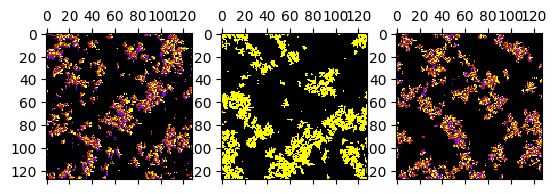

In [7]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1,ncols=3)
ax1.matshow(x_val1[500],cmap=plt.get_cmap(name="gnuplot",lut=5))
ax2.matshow(x_val2[500],cmap=plt.get_cmap(name="gnuplot",lut=5))
ax3.matshow(x_val3[500],cmap=plt.get_cmap(name="gnuplot",lut=5))

# Predict multiple models

In [8]:
models_one = ['orientation0216','orientation0226','orientation0236','orientation0246','orientation0256','orientation0266','orientation0276','orientation0286','orientation0296','orientation0306'] #array of model names
models_two = ['monochrome0216','monochrome0226','monochrome0236','monochrome0246','monochrome0256','monochrome0266','monochrome0276','monochrome0286','monochrome0296','monochrome0306'] # array of model names
models_three = ['scrambled0216','scrambled0226','scrambled0236','scrambled0246','scrambled0256','scrambled0266','scrambled0276','scrambled0286','scrambled0296','scrambled0306'] # array of model names

one_pred_of_one, one_actuals_of_one = predict_multi_by_name(models_one,x_val1,y_val1)
one_pred_of_two, one_actuals_of_two = predict_multi_by_name(models_one,x_val2,y_val2)
one_pred_of_three, one_actuals_of_three = predict_multi_by_name(models_one,x_val3,y_val3)

two_pred_of_two, two_actuals_of_two = predict_multi_by_name(models_two,x_val2,y_val2)
two_pred_of_one, two_actuals_of_one = predict_multi_by_name(models_two,x_val1,y_val1)
two_pred_of_three, two_actuals_of_three = predict_multi_by_name(models_two,x_val3,y_val3)

three_pred_of_three, three_actuals_of_three = predict_multi_by_name(models_three,x_val3,y_val3)
three_pred_of_one, three_actuals_of_one = predict_multi_by_name(models_three,x_val1,y_val1)
three_pred_of_two, three_actuals_of_two = predict_multi_by_name(models_three,x_val2,y_val2)

2024-04-16 13:02:52.008857: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-16 13:02:52.009050: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-16 13:02:52.009105: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# Plot one results

## Predict one on one

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.08768 +- 0.08044; Expected value within 1.078 stdevs of mean
Actual value 0.00105: Average = 0.09190 +- 0.08411; Expected value within 1.080 stdevs of mean
Actual value 0.00113: Average = 0.08831 +- 0.08035; Expected value within 1.085 stdevs of mean
Actual value 0.00121: Average = 0.08439 +- 0.07548; Expected value within 1.102 stdevs of mean
Actual value 0.0013: Average = 0.08477 +- 0.07560; Expected value within 1.104 stdevs of mean
Actual value 0.00139: Average = 0.07639 +- 0.06910; Expected value within 1.085 stdevs of mean
Actual value 0.0015: Average = 0.07906 +- 0.07357; Expected value within 1.054 stdevs of mean
Actual value 0.00161: Average = 0.07298 +- 0.06640; Expected value within 1.075 stdevs of mean
Actual value 0.00172: Average = 0.07547 +- 0.06834; Expected value within 1.079 stdevs of mean
Actual value 0.00185: Average = 0.06422 +- 0.05615; Expected value within 1.111 stdevs of mean
Actual val

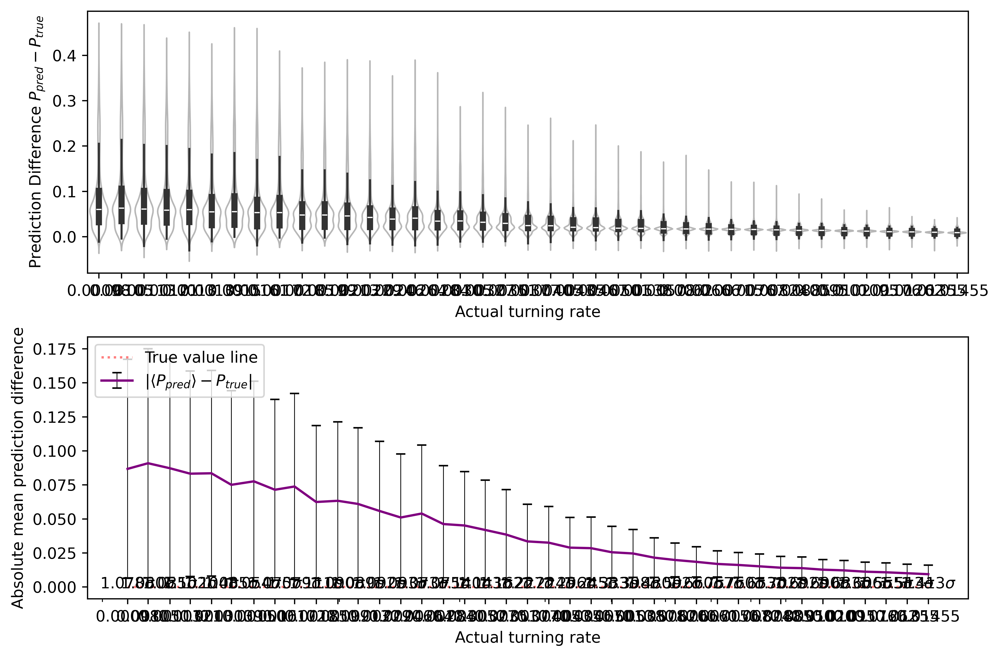

In [9]:
violin_plotter(one_pred_of_one,one_actuals_of_one,-0.001)

## Predict one on two

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.09439 +- 0.09741; Expected value within 0.959 stdevs of mean
Actual value 0.00105: Average = 0.09549 +- 0.09778; Expected value within 0.966 stdevs of mean
Actual value 0.00113: Average = 0.09408 +- 0.09640; Expected value within 0.964 stdevs of mean
Actual value 0.00121: Average = 0.09148 +- 0.09509; Expected value within 0.949 stdevs of mean
Actual value 0.0013: Average = 0.09150 +- 0.09408; Expected value within 0.959 stdevs of mean
Actual value 0.00139: Average = 0.08393 +- 0.08748; Expected value within 0.944 stdevs of mean
Actual value 0.0015: Average = 0.08654 +- 0.08995; Expected value within 0.945 stdevs of mean
Actual value 0.00161: Average = 0.07968 +- 0.08180; Expected value within 0.954 stdevs of mean
Actual value 0.00172: Average = 0.08490 +- 0.08815; Expected value within 0.944 stdevs of mean
Actual value 0.00185: Average = 0.07739 +- 0.08086; Expected value within 0.934 stdevs of mean
Actual val

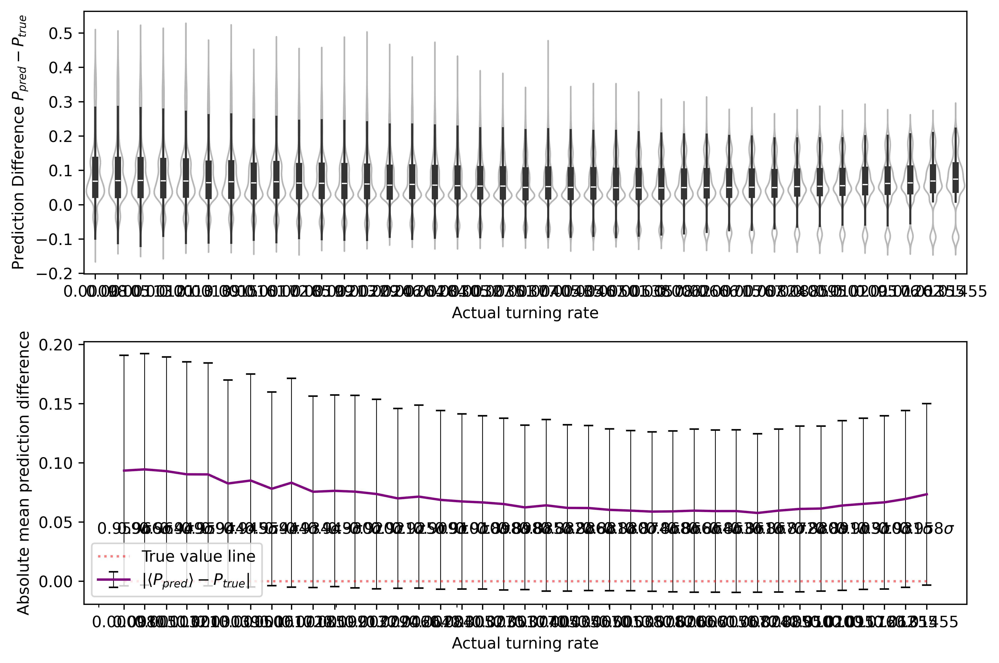

In [10]:
violin_plotter(one_pred_of_two,one_actuals_of_two,0.04,'lower left')

## Predict one on three

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.11379 +- 0.09245; Expected value within 1.220 stdevs of mean
Actual value 0.00105: Average = 0.11851 +- 0.09566; Expected value within 1.228 stdevs of mean
Actual value 0.00113: Average = 0.11442 +- 0.09208; Expected value within 1.230 stdevs of mean
Actual value 0.00121: Average = 0.11061 +- 0.08789; Expected value within 1.245 stdevs of mean
Actual value 0.0013: Average = 0.11125 +- 0.08819; Expected value within 1.247 stdevs of mean
Actual value 0.00139: Average = 0.10073 +- 0.08168; Expected value within 1.216 stdevs of mean
Actual value 0.0015: Average = 0.10419 +- 0.08540; Expected value within 1.202 stdevs of mean
Actual value 0.00161: Average = 0.09675 +- 0.07824; Expected value within 1.216 stdevs of mean
Actual value 0.00172: Average = 0.10057 +- 0.08076; Expected value within 1.224 stdevs of mean
Actual value 0.00185: Average = 0.08699 +- 0.06894; Expected value within 1.235 stdevs of mean
Actual val

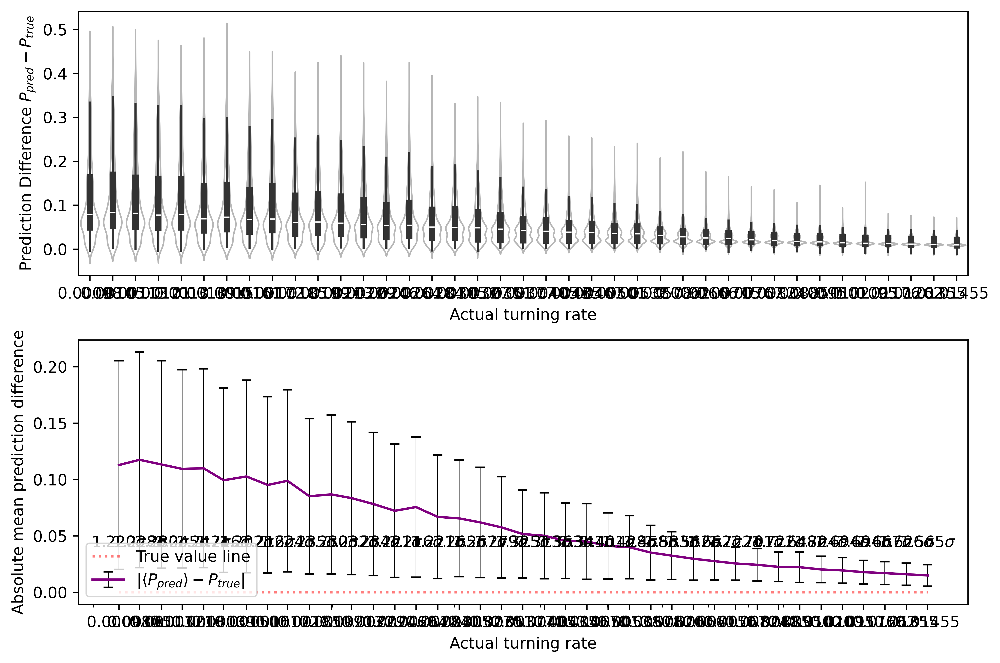

In [11]:
violin_plotter(one_pred_of_three,one_actuals_of_three,0.04,'lower left')

# Plot monochrome results

## Predict two on two

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.07138 +- 0.08301; Expected value within 0.848 stdevs of mean
Actual value 0.00105: Average = 0.07483 +- 0.08598; Expected value within 0.858 stdevs of mean
Actual value 0.00113: Average = 0.07301 +- 0.08277; Expected value within 0.868 stdevs of mean
Actual value 0.00121: Average = 0.06976 +- 0.07919; Expected value within 0.866 stdevs of mean
Actual value 0.0013: Average = 0.07017 +- 0.07953; Expected value within 0.866 stdevs of mean
Actual value 0.00139: Average = 0.06470 +- 0.07359; Expected value within 0.860 stdevs of mean
Actual value 0.0015: Average = 0.06642 +- 0.07714; Expected value within 0.842 stdevs of mean
Actual value 0.00161: Average = 0.06289 +- 0.07096; Expected value within 0.864 stdevs of mean
Actual value 0.00172: Average = 0.06317 +- 0.07250; Expected value within 0.848 stdevs of mean
Actual value 0.00185: Average = 0.05643 +- 0.06251; Expected value within 0.873 stdevs of mean
Actual val

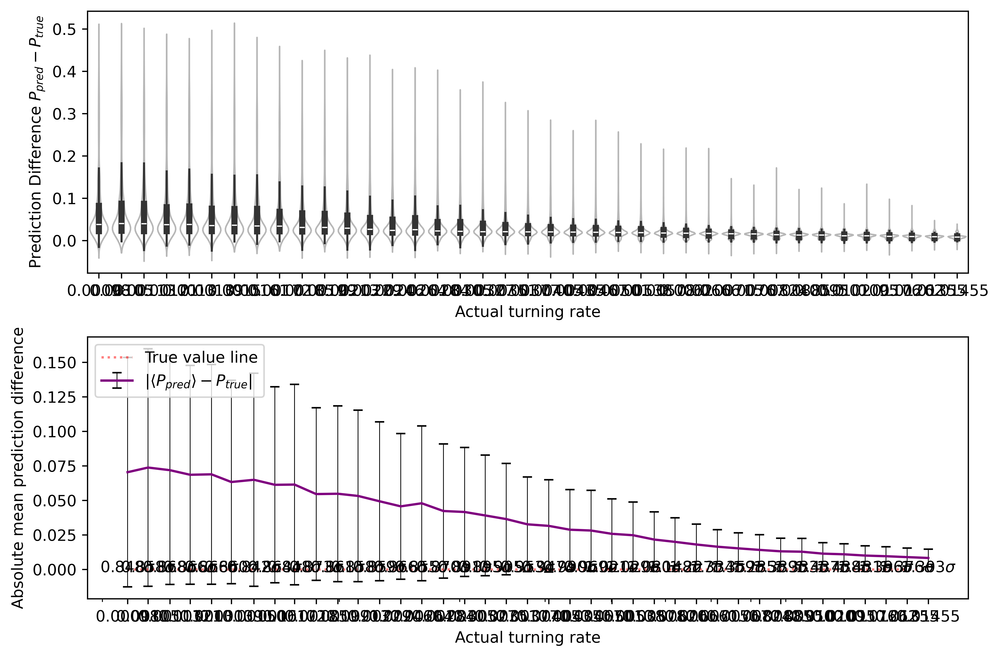

In [12]:
violin_plotter(two_pred_of_two,two_actuals_of_two,-0.002)

## Predict two on one

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.21357 +- 0.25940; Expected value within 0.820 stdevs of mean
Actual value 0.00105: Average = 0.21525 +- 0.26132; Expected value within 0.820 stdevs of mean
Actual value 0.00113: Average = 0.21421 +- 0.26021; Expected value within 0.819 stdevs of mean
Actual value 0.00121: Average = 0.21278 +- 0.25913; Expected value within 0.816 stdevs of mean
Actual value 0.0013: Average = 0.21290 +- 0.25948; Expected value within 0.815 stdevs of mean
Actual value 0.00139: Average = 0.21067 +- 0.25747; Expected value within 0.813 stdevs of mean
Actual value 0.0015: Average = 0.21115 +- 0.25821; Expected value within 0.812 stdevs of mean
Actual value 0.00161: Average = 0.21024 +- 0.25796; Expected value within 0.809 stdevs of mean
Actual value 0.00172: Average = 0.20956 +- 0.25709; Expected value within 0.808 stdevs of mean
Actual value 0.00185: Average = 0.20650 +- 0.25519; Expected value within 0.802 stdevs of mean
Actual val

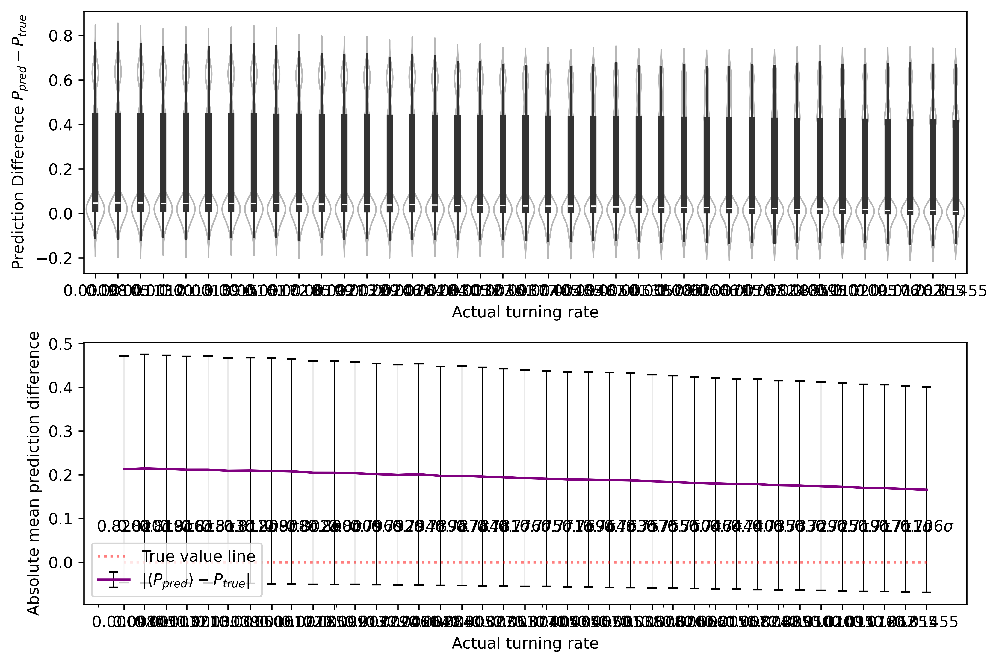

In [13]:
violin_plotter(two_pred_of_one,two_actuals_of_one,0.07,'lower left')

## Predict two on three

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.21993 +- 0.26280; Expected value within 0.833 stdevs of mean
Actual value 0.00105: Average = 0.22166 +- 0.26470; Expected value within 0.833 stdevs of mean
Actual value 0.00113: Average = 0.22053 +- 0.26362; Expected value within 0.832 stdevs of mean
Actual value 0.00121: Average = 0.21933 +- 0.26278; Expected value within 0.830 stdevs of mean
Actual value 0.0013: Average = 0.21954 +- 0.26319; Expected value within 0.829 stdevs of mean
Actual value 0.00139: Average = 0.21695 +- 0.26105; Expected value within 0.826 stdevs of mean
Actual value 0.0015: Average = 0.21754 +- 0.26168; Expected value within 0.826 stdevs of mean
Actual value 0.00161: Average = 0.21634 +- 0.26140; Expected value within 0.821 stdevs of mean
Actual value 0.00172: Average = 0.21591 +- 0.26063; Expected value within 0.822 stdevs of mean
Actual value 0.00185: Average = 0.21263 +- 0.25896; Expected value within 0.814 stdevs of mean
Actual val

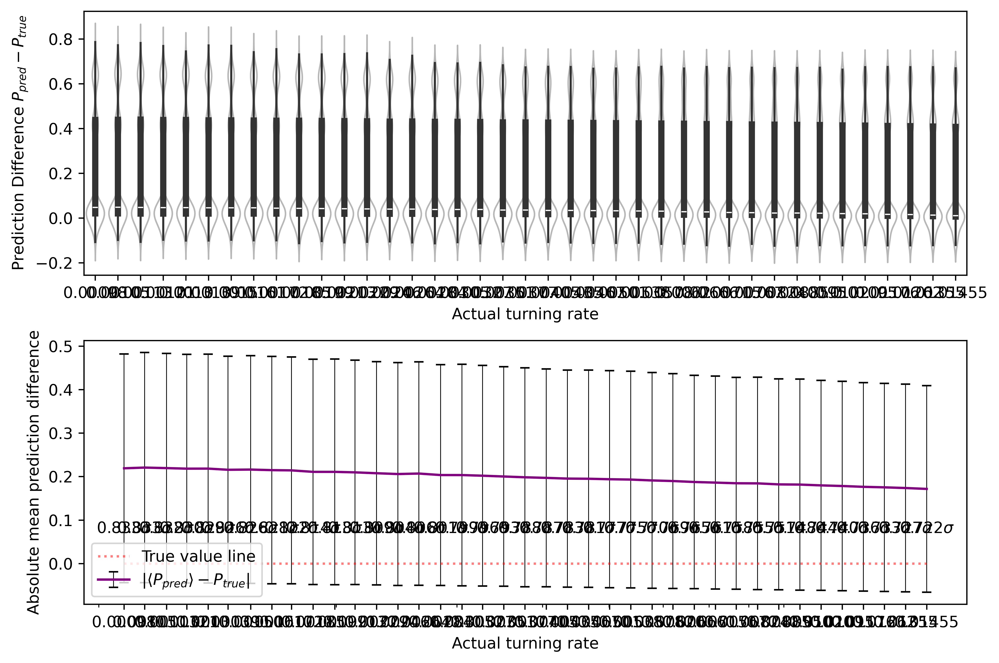

In [14]:
violin_plotter(two_pred_of_three,two_actuals_of_three,0.07,'lower left')

# Plot Scrambled Results

## Predict three on three

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.06362 +- 0.06201; Expected value within 1.010 stdevs of mean
Actual value 0.00105: Average = 0.06742 +- 0.06584; Expected value within 1.008 stdevs of mean
Actual value 0.00113: Average = 0.06479 +- 0.06197; Expected value within 1.027 stdevs of mean
Actual value 0.00121: Average = 0.06209 +- 0.05880; Expected value within 1.035 stdevs of mean
Actual value 0.0013: Average = 0.06248 +- 0.05916; Expected value within 1.034 stdevs of mean
Actual value 0.00139: Average = 0.05516 +- 0.05194; Expected value within 1.035 stdevs of mean
Actual value 0.0015: Average = 0.05770 +- 0.05647; Expected value within 0.995 stdevs of mean
Actual value 0.00161: Average = 0.05258 +- 0.04878; Expected value within 1.045 stdevs of mean
Actual value 0.00172: Average = 0.05487 +- 0.05169; Expected value within 1.028 stdevs of mean
Actual value 0.00185: Average = 0.04684 +- 0.04127; Expected value within 1.090 stdevs of mean
Actual val

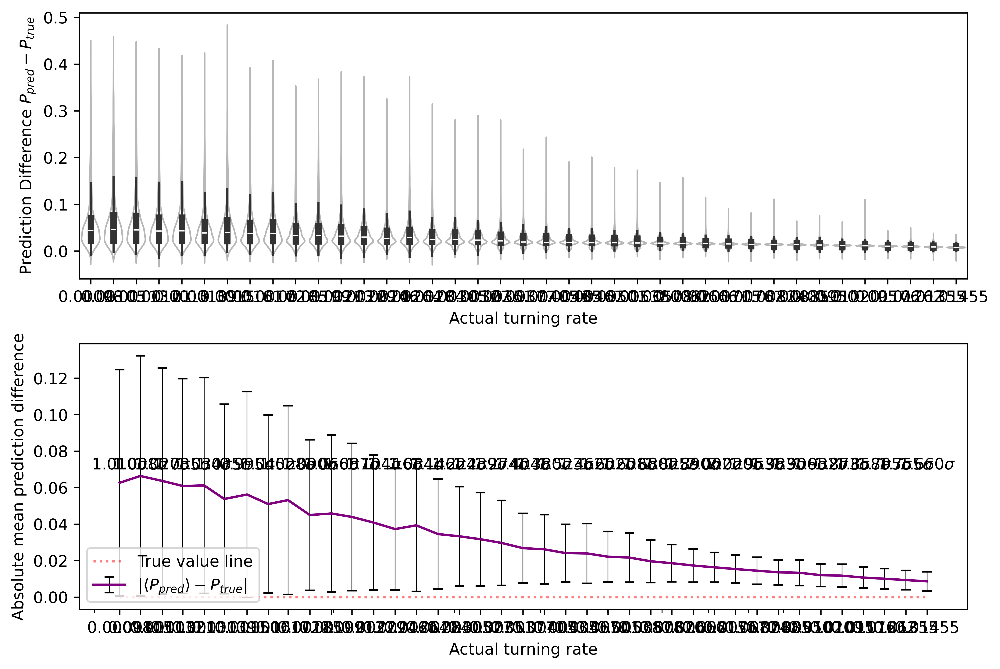

In [15]:
violin_plotter(three_pred_of_three,three_actuals_of_three,0.07,'lower left')

## Predict three on one

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.05603 +- 0.05871; Expected value within 0.938 stdevs of mean
Actual value 0.00105: Average = 0.05929 +- 0.06308; Expected value within 0.923 stdevs of mean
Actual value 0.00113: Average = 0.05675 +- 0.05868; Expected value within 0.948 stdevs of mean
Actual value 0.00121: Average = 0.05448 +- 0.05535; Expected value within 0.962 stdevs of mean
Actual value 0.0013: Average = 0.05462 +- 0.05546; Expected value within 0.961 stdevs of mean
Actual value 0.00139: Average = 0.04832 +- 0.04855; Expected value within 0.967 stdevs of mean
Actual value 0.0015: Average = 0.05064 +- 0.05389; Expected value within 0.912 stdevs of mean
Actual value 0.00161: Average = 0.04617 +- 0.04685; Expected value within 0.951 stdevs of mean
Actual value 0.00172: Average = 0.04793 +- 0.04857; Expected value within 0.951 stdevs of mean
Actual value 0.00185: Average = 0.04085 +- 0.03853; Expected value within 1.012 stdevs of mean
Actual val

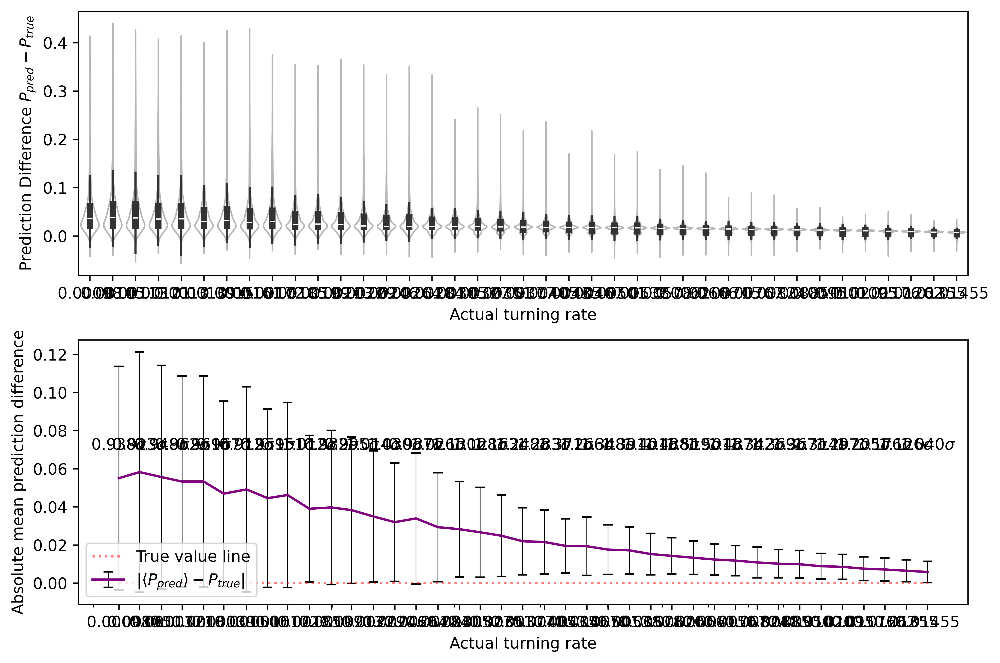

In [16]:
violin_plotter(three_pred_of_one,three_actuals_of_one,0.07,'lower left')

## Predict three on two

Prediction means and standard deviations.
Actual value 0.00098: Average = 0.08428 +- 0.08892; Expected value within 0.937 stdevs of mean
Actual value 0.00105: Average = 0.08515 +- 0.08939; Expected value within 0.941 stdevs of mean
Actual value 0.00113: Average = 0.08397 +- 0.08827; Expected value within 0.938 stdevs of mean
Actual value 0.00121: Average = 0.08225 +- 0.08816; Expected value within 0.919 stdevs of mean
Actual value 0.0013: Average = 0.08239 +- 0.08710; Expected value within 0.931 stdevs of mean
Actual value 0.00139: Average = 0.07479 +- 0.07951; Expected value within 0.923 stdevs of mean
Actual value 0.0015: Average = 0.07717 +- 0.08246; Expected value within 0.918 stdevs of mean
Actual value 0.00161: Average = 0.07009 +- 0.07270; Expected value within 0.942 stdevs of mean
Actual value 0.00172: Average = 0.07639 +- 0.08095; Expected value within 0.922 stdevs of mean
Actual value 0.00185: Average = 0.06885 +- 0.07352; Expected value within 0.911 stdevs of mean
Actual val

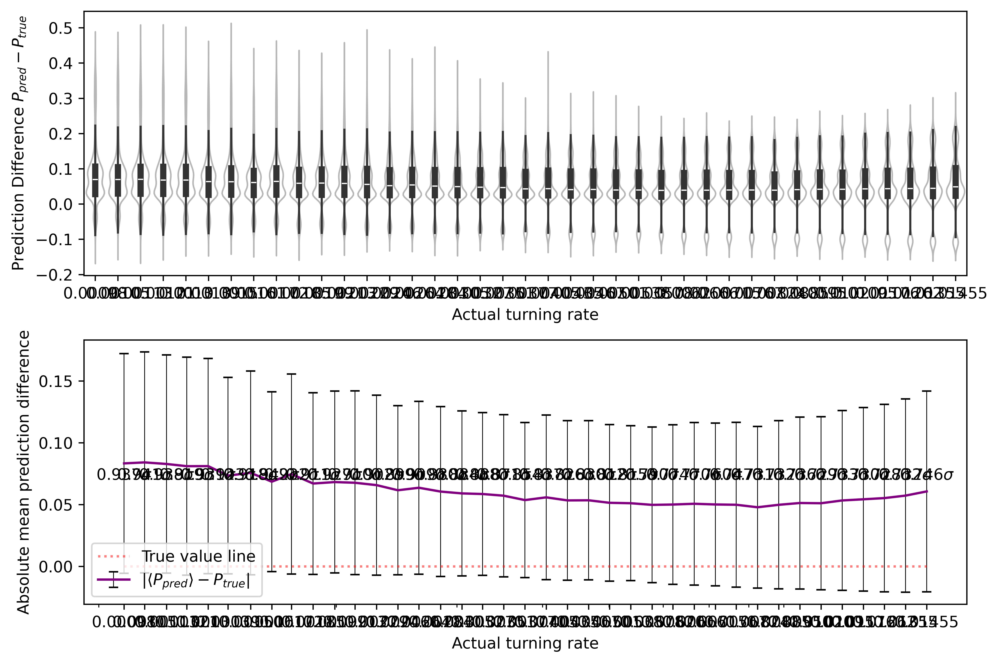

In [17]:
violin_plotter(three_pred_of_two,three_actuals_of_two,0.07,'lower left')

## Combined plots

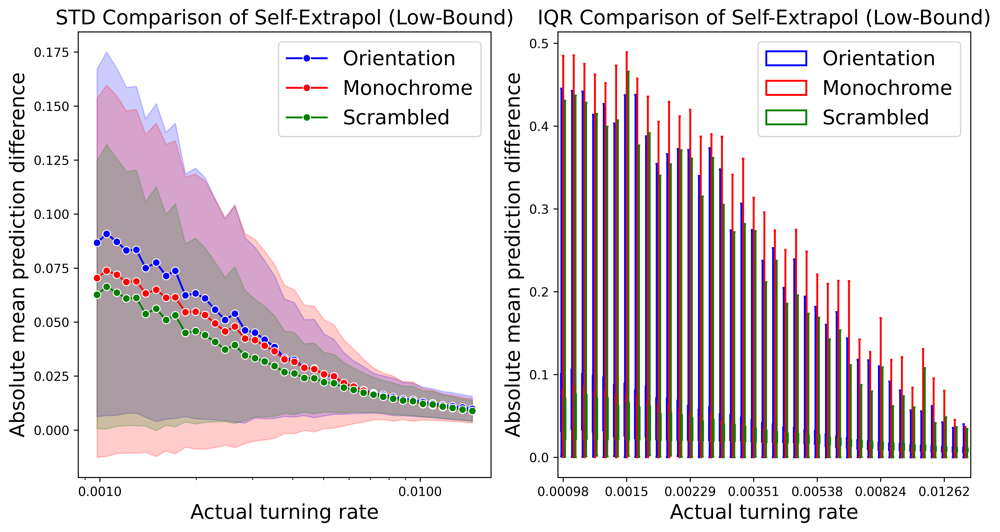

In [18]:
#predictions on own kind
#means1,std1,means2,std2,means3,std3=cross_mean_err_calculator(one_pred_of_one,one_actuals_of_one,two_pred_of_two,two_actuals_of_two,three_pred_of_three,three_actuals_of_three,three_cases=True)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(11,6),dpi=600)

#NOTE: I've commented out the previous method of plotting due to its inelegance, but I have kept it for posterity as a way of plotting error bands without seaborn.

#ONE ON ONE
#ax1.errorbar(np.sort(np.unique(orientation_actuals_of_orientation)),np.abs(means1-np.sort(np.unique(orientation_actuals_of_orientation))),yerr=(std1),ecolor='blue',elinewidth=0.5,capsize=3,color='blue',label="Trained Orientation Predicting Orientation")
#ax1.plot(np.sort(np.unique(one_actuals_of_one)),np.abs(means1-np.sort(np.unique(one_actuals_of_one))),'b-',label="Trained Orientation Predicting Orientation")
#ax1.fill_between(np.sort(np.unique(one_actuals_of_one)),np.abs(means1-np.sort(np.unique(one_actuals_of_one)))-std1,np.abs(means1-np.sort(np.unique(one_actuals_of_one)))+std1,color='b',alpha=0.25)

#TWO ON TWO
#ax1.errorbar(np.sort(np.unique(monochrome_actuals_of_monochrome)),np.abs(means2-np.sort(np.unique(monochrome_actuals_of_monochrome))),yerr=(std2),ecolor='red',elinewidth=0.5,capsize=3,color='red',label="Trained Monochrome Predicting Monochrome")
#ax1.plot(np.sort(np.unique(two_actuals_of_two)),np.abs(means2-np.sort(np.unique(two_actuals_of_two))),'r-',label="Trained Monochrome Predicting Monochrome")
#ax1.fill_between(np.sort(np.unique(two_actuals_of_two)),np.abs(means2-np.sort(np.unique(two_actuals_of_two)))-std2,np.abs(means2-np.sort(np.unique(two_actuals_of_two)))+std2,color='r',alpha=0.25)

#THREE ON THREE
#ax1.plot(np.sort(np.unique(three_actuals_of_three)),np.abs(means3-np.sort(np.unique(three_actuals_of_three))),'g-',label="Trained Scrambled Predicting Scrambled")
#ax1.fill_between(np.sort(np.unique(three_actuals_of_three)),np.abs(means3-np.sort(np.unique(three_actuals_of_three)))-std3,np.abs(means3-np.sort(np.unique(three_actuals_of_three)))+std3,color='g',alpha=0.25)

#ZERO LINE, LEGEND, AX1 PLOT CONFIG
#ax1.plot(np.sort(np.unique(one_actuals_of_one)),np.zeros(np.unique(one_actuals_of_one).shape[0]),color='black',label='True value line',linestyle='dotted',alpha=0.5)
#ax1.legend(loc='upper left')
#ax1.set_xscale("log")
#ax1.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
#ax1.set_xticks(np.unique(y_val1))
#ax1.set_xlabel("Actual turning rate")
#ax1.set_ylabel("Absolute mean prediction difference")

df_one = pd.DataFrame()
df_two = pd.DataFrame()
df_three = pd.DataFrame()
df_one.insert(0,"predicted",np.abs(one_pred_of_one-one_actuals_of_one))
df_one.insert(1,"actuals",one_actuals_of_one)
df_two.insert(0,"predicted",np.abs(two_pred_of_two-two_actuals_of_two))
df_two.insert(1,"actuals",np.abs(two_actuals_of_two))
df_three.insert(0,"predicted",np.abs(three_pred_of_three-three_actuals_of_three))
df_three.insert(1,"actuals",np.abs(three_actuals_of_three))
df_one['Data Type']='Orientation'
df_two['Data Type']='Monochrome'
df_three['Data Type']='Scrambled'
cdf = pd.concat([df_one,df_two,df_three])
#print(cdf.head())

sns.lineplot(ax=ax1,
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"},
             marker='o')

sns.boxplot(ax=ax2,
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax1.set_xlabel("Actual turning rate",fontsize=16)
ax2.set_xlabel("Actual turning rate",fontsize=16)
ax1.set_ylabel("Absolute mean prediction difference",fontsize=16)
ax2.set_ylabel("Absolute mean prediction difference",fontsize=16)
ax2.set_title("IQR Comparison of Self-Extrapol (Low-Bound)",fontsize=16)
ax1.set_title("STD Comparison of Self-Extrapol (Low-Bound)",fontsize=16)

ax1.set_xscale("log")
ax1.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
#ax1.set_xticks([0.001,0.002,0.004,0.008,0.016])
#ax1.set_ylim([0,0.12])
#ax2.set_ylim([0,0.25])
#ax1.xaxis.set_major_locator(plt.MaxNLocator(8))
ax2.xaxis.set_major_locator(plt.MaxNLocator(7))


#handles,labels=ax2.get_legend_handles_labels()
#ax2.legend(handles=handles[1:],labels=labels[1:]) #this should fix hue title appearing in rightmost figure legend
ax1.legend(loc="upper right",fontsize=16)
ax2.legend(fontsize=16)


#predictions on other kind
#means1,std1,means2,std2,means3,std3=cross_mean_err_calculator(one_pred_of_two,one_actuals_of_two,two_pred_of_one,two_actuals_of_one,three_cases=False)

#ONE ON TWO
#ax2.errorbar(np.sort(np.unique(orientation_actuals_of_monochrome)),np.abs(means1-np.sort(np.unique(orientation_actuals_of_monochrome))),yerr=(std1),ecolor='blue',elinewidth=0.5,capsize=3,color='blue',label="Trained Orientation Predicting Monochrome")
#ax2.plot(np.sort(np.unique(one_actuals_of_two)),np.abs(means1-np.sort(np.unique(one_actuals_of_two))),'b-',label="Trained Orientation Predicting Monochrome")
#ax2.fill_between(np.sort(np.unique(one_actuals_of_two)),np.abs(means1-np.sort(np.unique(one_actuals_of_two)))-std1,np.abs(means1-np.sort(np.unique(one_actuals_of_two)))+std1,color='b',alpha=0.25)

#TWO ON ONE
#ax2.errorbar(np.sort(np.unique(monochrome_actuals_of_orientation)),np.abs(means2-np.sort(np.unique(monochrome_actuals_of_orientation))),yerr=(std2),ecolor='red',elinewidth=0.5,capsize=3,color='red',label="Trained Monochrome Predicting Orientation")
#ax2.plot(np.sort(np.unique(two_actuals_of_one)),np.abs(means2-np.sort(np.unique(two_actuals_of_one))),'r-',label="Trained Monochrome Predicting Orientation")
#ax2.fill_between(np.sort(np.unique(two_actuals_of_one)),np.abs(means2-np.sort(np.unique(two_actuals_of_one)))-std2,np.abs(means2-np.sort(np.unique(two_actuals_of_one)))+std2,color='r',alpha=0.25)

#ZERO LINE, LEGEND, AX2 PLOT CONFIG
#ax2.plot(np.sort(np.unique(one_actuals_of_two)),np.zeros(np.unique(one_actuals_of_two).shape[0]),color='black',label='True value line',linestyle='dotted',alpha=0.5)
#ax2.legend(loc='upper left')
#ax2.set_xscale("log")
#ax2.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
#ax2.set_xticks(np.unique(y_val1))
#ax2.set_xlabel("Actual turning rate")
#ax2.set_ylabel("Absolute mean prediction difference")

fig.tight_layout()

In [19]:
df12=pd.DataFrame()
df21=pd.DataFrame()
df13=pd.DataFrame()
df31=pd.DataFrame()
df23=pd.DataFrame()
df32=pd.DataFrame()
df12.insert(0,"predicted",np.abs(one_pred_of_two-one_actuals_of_two))
df12.insert(1,"actuals",one_actuals_of_two)
df21.insert(0,"predicted",np.abs(two_pred_of_one-two_actuals_of_one))
df21.insert(1,"actuals",two_actuals_of_one)
df13.insert(0,"predicted",np.abs(one_pred_of_three-one_actuals_of_three))
df13.insert(1,"actuals",one_actuals_of_three)
df31.insert(0,"predicted",np.abs(three_pred_of_one-three_actuals_of_one))
df31.insert(1,"actuals",three_actuals_of_one)
df23.insert(0,"predicted",np.abs(two_pred_of_three-two_actuals_of_three))
df23.insert(1,"actuals",two_actuals_of_three)
df32.insert(0,"predicted",np.abs(three_pred_of_two-three_actuals_of_two))
df32.insert(1,"actuals",three_actuals_of_two)

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(12,16),dpi=600)

#PREDICTING ONE

df21['Data Type']='Monochrome'
df31['Data Type']='Scrambled'
cdf = pd.concat([df_one,df21,df31])

sns.lineplot(ax=ax[0][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"},
             marker='o')

sns.boxplot(ax=ax[0][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"},)



#PREDICTING TWO

df12['Data Type']='Orientation'
df32['Data Type']='Scrambled'
cdf = pd.concat([df12,df_two,df32])

sns.lineplot(ax=ax[1][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"},
             marker='o')

ax[0][0].legend(loc='upper right',fontsize=16)
ax[0][1].legend(loc='upper right',fontsize=16)

sns.boxplot(ax=ax[1][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax[1][0].legend(loc='upper right',fontsize=16)
ax[1][1].legend(loc='upper right',fontsize=16)

#PREDICTING THREE

df13['Data Type']='Orientation'
df23['Data Type']='Monochrome'
cdf = pd.concat([df13,df23,df_three])

sns.lineplot(ax=ax[2][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"},
             marker='o')

sns.boxplot(ax=ax[2][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax[2][0].legend(loc='upper right',fontsize=16)
ax[2][1].legend(fontsize=16)

for i,examiner in enumerate(["STD","IQR"]):
    for j,examined in enumerate(["Orientation","Monochrome","Scrambled"]):
        ax[j][i].set_xlabel("Actual turning rate",fontsize=16)
        ax[j][i].set_ylabel("Absolute mean prediction difference",fontsize=16)
        ax[j][i].set_title(f"{examiner} Comparison Extrapol on {examined} (Low-Bound)",fontsize=15.2)
        if i == 0:
            ax[j][i].set_xscale("log")
            ax[j][i].get_xaxis().set_major_formatter(ticker.ScalarFormatter())
            ax[j][i].set_xticks([0.001,0.002,0.004,0.008,0.016])
        else:
            ax[j][i].xaxis.set_major_locator(plt.MaxNLocator(8))



fig.tight_layout()
